In [1]:
from src.dependencies import *
from src.project_functions import *

In [2]:
display_markdown(project_documentation(), raw=True)

 This is the documentation to give description of contained
    functions. These functions were constructed to perform data visualization from velocity subsurface of a region. The functions have different purpose, including for importing database, arranging dataset which are visualization-ready, and subsetting dataset to create two-dimensional slice of subsurface volume.

# Subsurface Velocity of Basin
Velocity data that have been acquired can be visualized to illustrate the velocity distribution as one of important geological parameters to indicate basin lithology and/or structure. The visualization is important to be done in two- or three-dimensional to see the distribution pattern for further analysis

## Importing data
The data is usually obtained from numerous measurements in the same point as well as different point. It leads to hundreds of large-sized database that should be imported. In order to import the data effectively, the dedicated function of importing file was constructed to acquire and merge different files into one single database

## Dataset for Plotly Visualization
Plotly is a Python visualization package that require grid data as the input. The unified database will be further tailored to follow the required structure that is plotly-friendly

## Create Slice Data
While Matplotlib and Plotly can execute 3D visualization, 2D plots are also needed to display clearer velocity parameters in certain orientations. This project will create two-dimensional slices in constant latitude (east-west), constant longitude (north_south), as well as diagonal direction

## Iso-velocity contour
Create depth contour map of constant velocity value (for example, visualize depth contour from V = 1.0 km/s or V = 2.5 km/s) 
    

## Execute Functions 

In [3]:
import warnings
warnings.filterwarnings('ignore')

### Set Directory

In [4]:
#Change file directory
os.chdir(r"/Users/dzakyirfan/Documents/Jakarta Vs dataset")

#Iterates through all dat file in the working directory
list_of_files = [i for i in glob.glob("*.dat")]

### Import File

In [5]:
vs_array = import_file(list_of_files)

print(vs_array)
print(vs_array.shape)

[[-6.1428600e+00  1.0696190e+02 -0.0000000e+00  3.3427300e-01]
 [-6.1428600e+00  1.0696190e+02 -5.0000000e-02  3.3427300e-01]
 [-6.1428600e+00  1.0696190e+02 -1.0000000e-01  3.3427300e-01]
 ...
 [-6.3714300e+00  1.0694683e+02 -3.9000000e+00  2.8564050e+00]
 [-6.3714300e+00  1.0694683e+02 -3.9500000e+00  2.8566610e+00]
 [-6.3714300e+00  1.0694683e+02 -4.0000000e+00  2.8568720e+00]]
(35802, 4)


In [6]:
lat_list, long_list, d_list = parameter_list(vs_array)

### Matplotlib Visualization

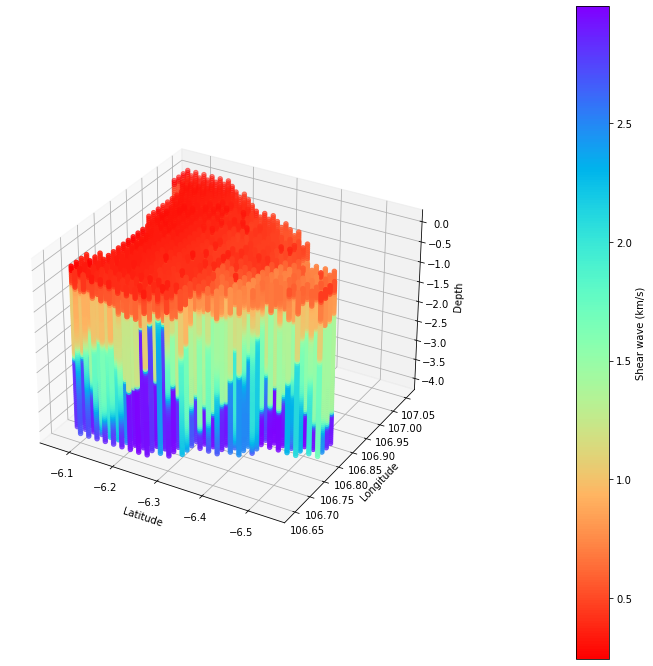

In [7]:
# 3D Visualization with Matplotlib
mpl_jakarta = basin_scatterplot(vs_array)

### Plotly Visualization

In [8]:
vs_database = plotly_friendly_dataframe(vs_array)

print(vs_database)
print(vs_database.shape)

       Latitude  Longitude  Depth        Vs
35802  -6.54286  106.64524  -4.00       NaN
35803  -6.54286  106.64524  -3.95       NaN
35804  -6.54286  106.64524  -3.90       NaN
35805  -6.54286  106.64524  -3.85       NaN
35806  -6.54286  106.64524  -3.80       NaN
...         ...        ...    ...       ...
13369  -6.06667  107.05238  -0.20  0.434449
13368  -6.06667  107.05238  -0.15  0.434192
13367  -6.06667  107.05238  -0.10  0.244064
13366  -6.06667  107.05238  -0.05  0.244064
13365  -6.06667  107.05238  -0.00  0.244064

[58968 rows x 4 columns]
(58968, 4)


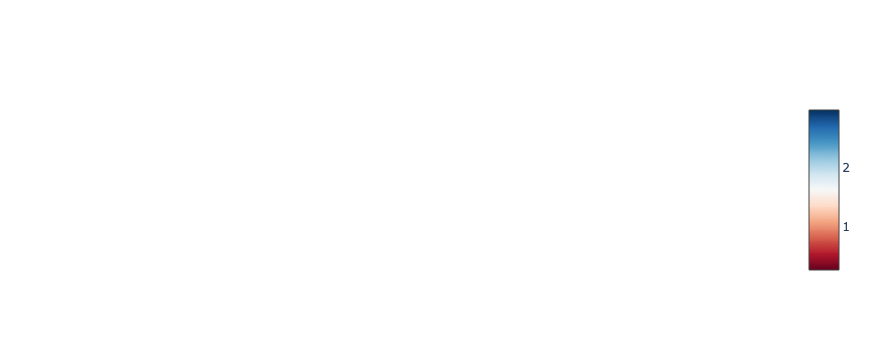

In [9]:
#3D Visualization
#Convert pandas dataframe to numpy array

new_vs = vs_database['Vs'].to_numpy()
new_lat = vs_database['Latitude'].to_numpy()
new_long = vs_database['Longitude'].to_numpy()
new_depth = vs_database['Depth'].to_numpy()

fig = go.Figure(data=go.Volume(x=new_long, 
                               y=new_lat, 
                               z=new_depth, 
                               value=new_vs, 
                               isomin=np.min(vs_array[:,3]), 
                               isomax=np.max(vs_array[:,3]), 
                               opacity=0.4,
                               surface_count=20,
                               colorscale='RdBu',
                              ))

fig.show()

## Volume Slicing

### Northeast - Southwest Diagonal Slice

In [10]:
#Northeast - Southwest cross-section
nesw_database = northeast_southwest_slice(vs_array, vs_database)

print(nesw_database.head())
print(nesw_database.shape)

       Latitude  Longitude  Depth        Vs
17333  -6.42857  106.73571  -4.00  2.681217
17332  -6.42857  106.73571  -3.95  2.595787
17331  -6.42857  106.73571  -3.90  2.517442
17330  -6.42857  106.73571  -3.85  2.442724
17329  -6.42857  106.73571  -3.80  2.374043
(1620, 4)


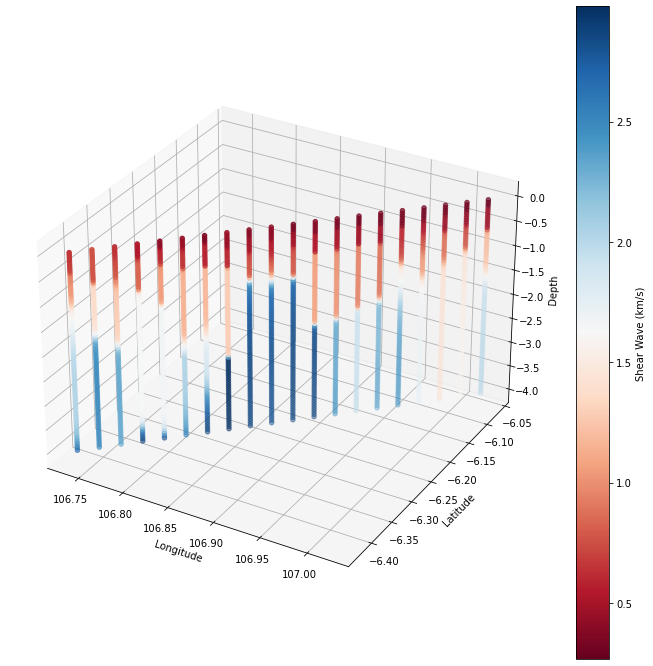

In [11]:
#Visualization
#3D Scatterplot
nesw_scatterplot = slice_scatterplot(nesw_database)

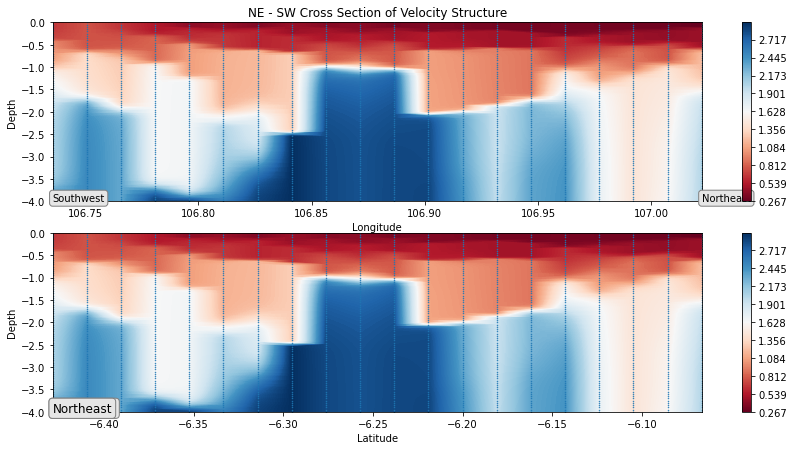

In [12]:
northeast_southwest_contourplot(nesw_database)

### Northwest - Southeast Diagonal Slice

In [13]:
nwse_database = northwest_southeast_slice(vs_array, vs_database)

print(nwse_database.head())
print(nwse_database.shape)

       Latitude  Longitude  Depth        Vs
10853  -6.40952  106.91667  -4.00  2.837219
10852  -6.40952  106.91667  -3.95  2.837208
10851  -6.40952  106.91667  -3.90  2.837168
10850  -6.40952  106.91667  -3.85  2.837107
10849  -6.40952  106.91667  -3.80  2.837073
(1458, 4)


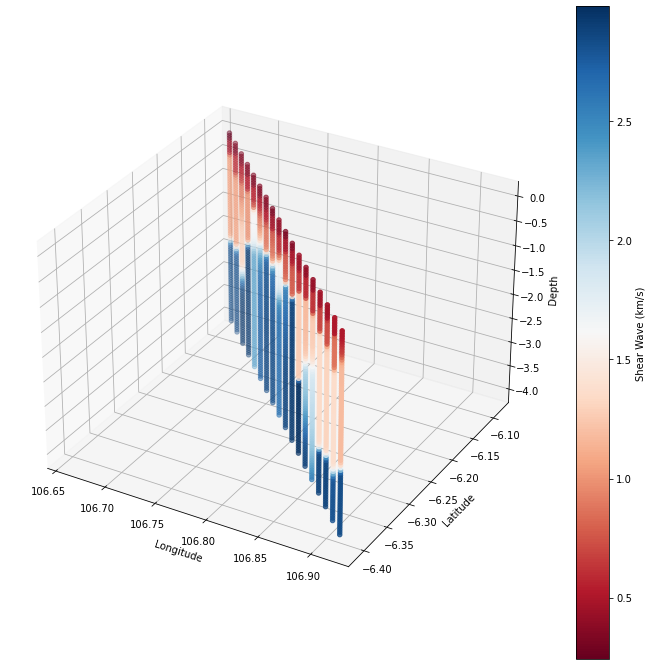

In [14]:
#Visualization
#3D Scatterplot
slice_scatterplot(nwse_database)

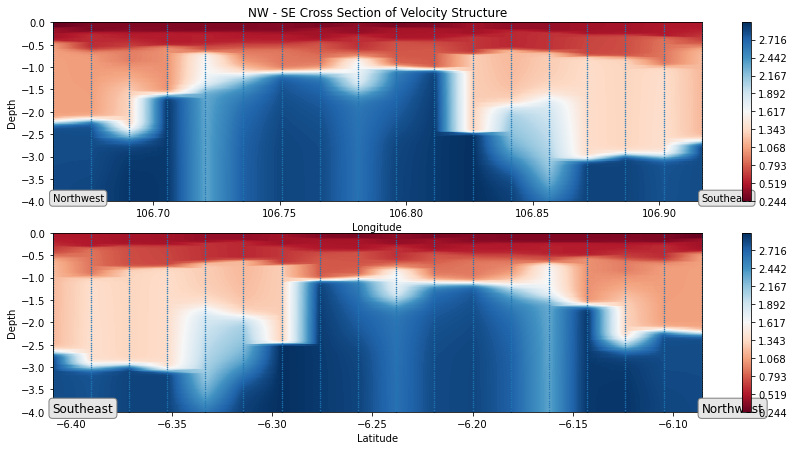

In [15]:
northwest_southeast_contourplot(nwse_database)

### North - South Latitude Slice

In [16]:
#Determine constant longitude to create north-south cross section
long = long_list[13]

ns_database = north_south_slice(vs_database, long)

print(ns_database.head())
print(ns_database.shape)

       Latitude  Longitude  Depth        Vs
34748  -6.52381  106.84127  -4.00  2.861192
34747  -6.52381  106.84127  -3.95  2.861132
34746  -6.52381  106.84127  -3.90  2.860956
34745  -6.52381  106.84127  -3.85  2.860751
34744  -6.52381  106.84127  -3.80  2.860441
(1782, 4)


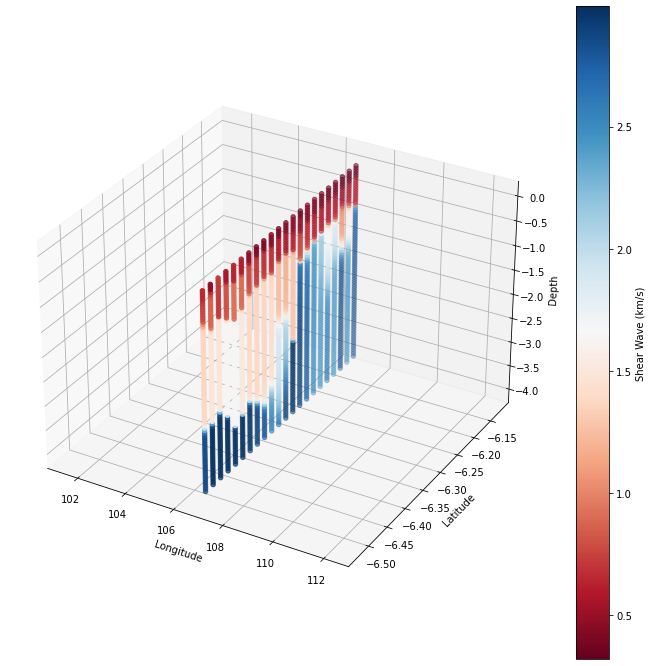

In [17]:
#Visualization
#3D Scatterplot
slice_scatterplot(ns_database)

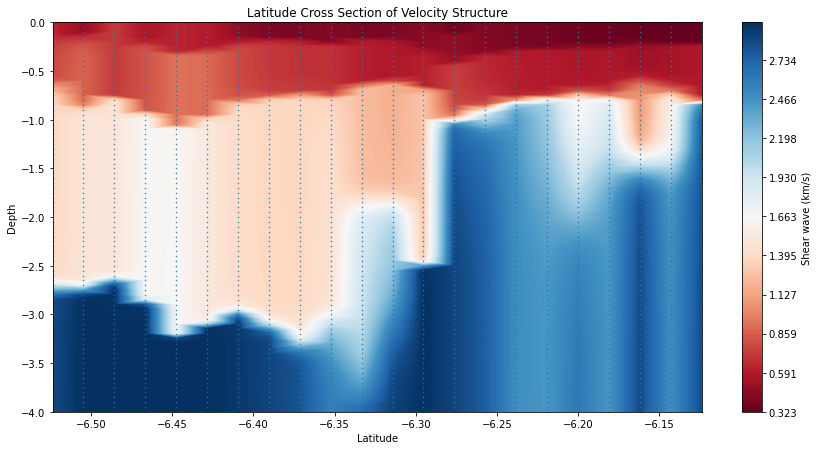

In [18]:
#2D Contourplot
latitudinal_longitudinal_contourplot(ns_database, 'Latitude')

### East - West Longitude Slide

In [19]:
#Determine constant latitude to create north-south cross section
lat = lat_list[12]

ew_database = east_west_slice(vs_database, lat)

print(ew_database.head())
print(ew_database.shape)

      Latitude  Longitude  Depth        Vs
9719  -6.31429   106.6754  -4.00  2.266274
9718  -6.31429   106.6754  -3.95  2.250962
9717  -6.31429   106.6754  -3.90  2.235968
9716  -6.31429   106.6754  -3.85  2.221584
9715  -6.31429   106.6754  -3.80  2.208156
(1701, 4)


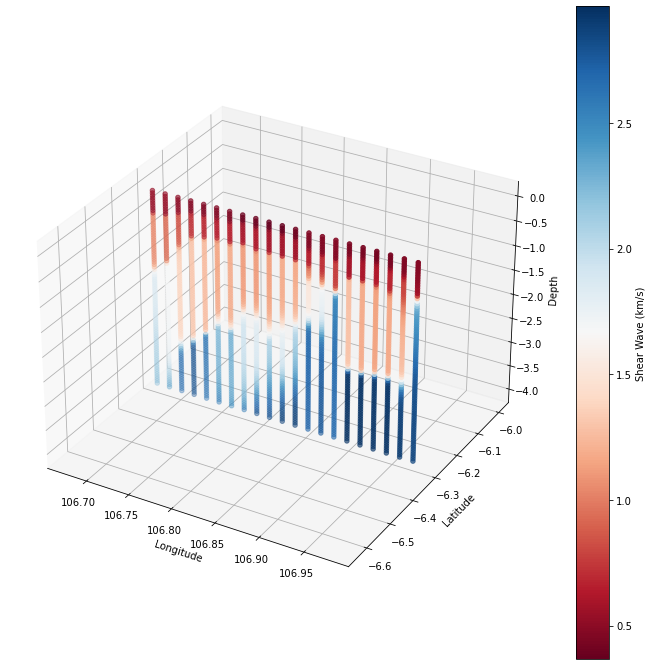

In [20]:
#Visualization
#3D Scatterplot
slice_scatterplot(ew_database)

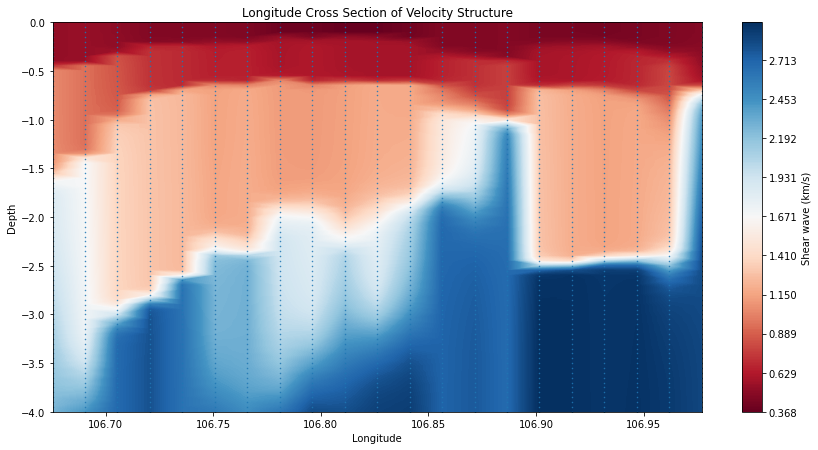

In [21]:
latitudinal_longitudinal_contourplot(ew_database, 'Longitude')

## Iso-velocity Contour Map

In [22]:
shear_velocity = 1.3

z_dataset = isovelocity(list_of_files, shear_velocity)

print(z_dataset)

[[  -6.14286     106.9619     1090.68395552]
 [  -6.25714     106.97698     714.01693788]
 [  -6.31429     106.9619     2203.20969505]
 ...
 [  -6.2         107.00714     783.0988243 ]
 [  -6.1619      106.99206     760.21327961]
 [  -6.37143     106.94683    2425.09350394]]


Text(0, 0.5, 'Depth (m)')

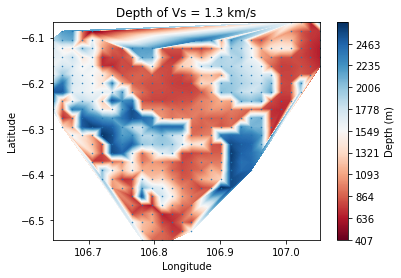

In [23]:
##Plotting Contour
z_lat = z_dataset[:,0]
z_long = z_dataset[:,1]
z_depth = z_dataset[:,2]

levels = np.linspace(z_depth.min(), z_depth.max(), 500)

#Plot
fig, ax = plt.subplots()
plot_z1= ax.tricontourf(z_long, z_lat, z_depth, levels=levels, cmap='RdBu')

ax.plot(z_long, z_lat, 'o', markersize=0.5)
ax.set(xlim=(z_long.min(), z_long.max()), ylim=(z_lat.min(), z_lat.max()))
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Depth of Vs = ' + str(shear_velocity) + ' km/s')

cbar = fig.colorbar(plot_z1)
cbar.ax.set_ylabel('Depth (m)')

In [24]:
plt.savefig('isovelocity.png')

<Figure size 432x288 with 0 Axes>